In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew, kurtosis
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import plotly.express as px
from scipy.signal import find_peaks
from pprint import pprint
%run Data_manipulation.ipynb

In [2]:
IBOV = pd.read_csv('D:/UFG/Data collection/IBOV.csv')
IBOV['Date']= pd.to_datetime(IBOV['Date'], format='%Y-%m-%d')
IBOV.head()

,Date,Open,High,Low,Close,Volume (in Million)
0,2000-01-03,17098.0,17408.0,16719.0,16930.0,0.0
1,2000-01-04,16908.0,16908.0,15851.0,15851.0,0.0
2,2000-01-05,15871.0,16302.0,15350.0,16245.0,0.0
3,2000-01-06,16237.0,16499.0,15977.0,16107.0,0.0
4,2000-01-07,16125.0,16449.0,16125.0,16309.0,0.0


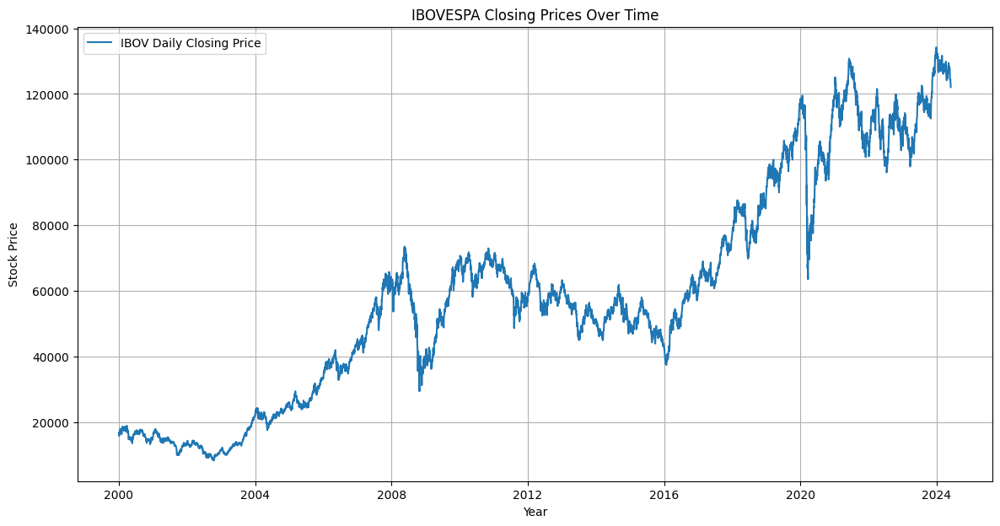

In [3]:
# NIFTY closing price
plt.figure(figsize=(14, 7))
plt.plot(IBOV['Date'], IBOV['Close'], label='IBOV Daily Closing Price')
plt.title('IBOVESPA Closing Prices Over Time')
plt.xlabel('Year')
plt.ylabel('Stock Price')
plt.legend()
plt.grid(True)
plt.show()

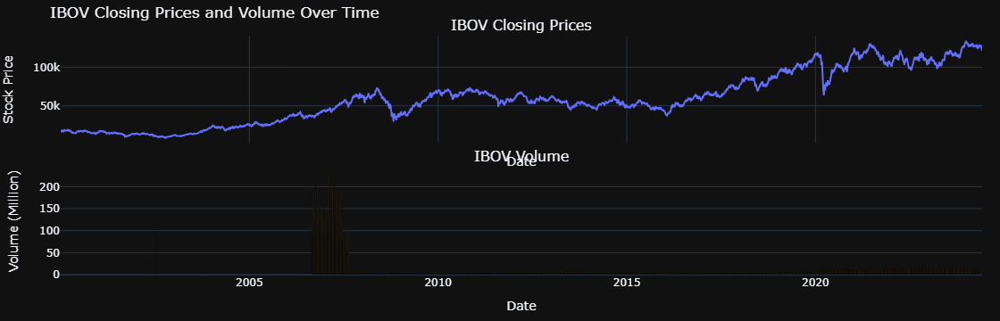

In [4]:
# Create subplots with shared x-axis
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.1,
                    subplot_titles=('IBOV Closing Prices', 'IBOV Volume'))

# Add closing price trace
fig.add_trace(go.Scatter(x=IBOV['Date'], y=IBOV['Close'], mode='lines', name='IBOV Close Price'),
              row=1, col=1)

# Add volume trace
fig.add_trace(go.Bar(x=IBOV['Date'], y=IBOV['Volume (in Million)'], name='IBOV Volume',  marker_color='orange'),
              row=2, col=1)

# Customize layout
fig.update_layout(
    title='IBOV Closing Prices and Volume Over Time',
    xaxis_title='Date',
    yaxis_title='Stock Price',
    template='plotly_dark',  # Use dark theme
    showlegend=False,
    height=700,  # Set plot height
    margin=dict(l=20, r=20, t=40, b=20),  # Adjust margins for better visibility
)

# Customize x-axis for the volume subplot
fig.update_xaxes(title_text='Date', row=2, col=1)

# Customize y-axes for the subplots
fig.update_yaxes(title_text='Stock Price', row=1, col=1)
fig.update_yaxes(title_text='Volume (Million)', row=2, col=1)

# Show plot
fig.show()


### *Unfortunately, I was not able to extract the volume data for the IBOVESPA*

Skewness of IBOV Close: 0.3847913372127669
Kurtosis of IBOV Close: -0.7576232407467831



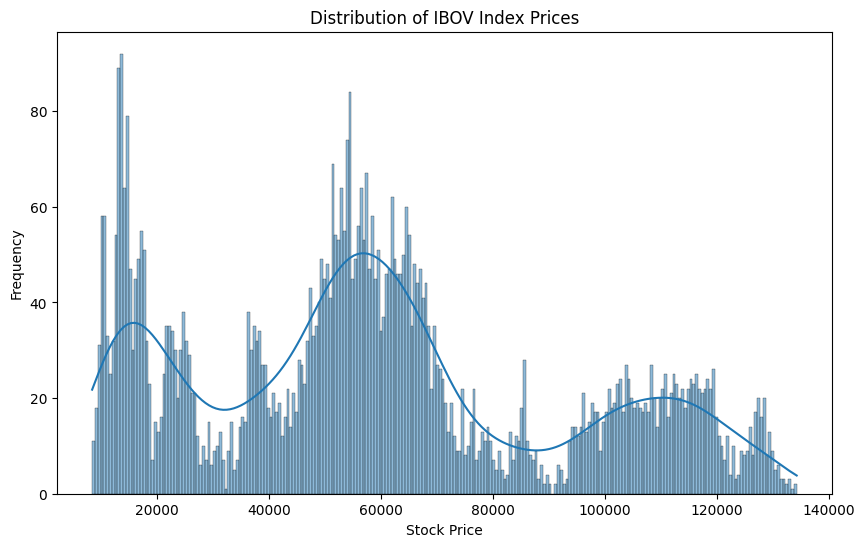

In [5]:
# Calculate the skewness and kurtosis
close_skewness = IBOV['Close'].skew()
close_kurtosis = IBOV['Close'].kurtosis()

print(f"Skewness of IBOV Close: {close_skewness}")
print(f"Kurtosis of IBOV Close: {close_kurtosis}\n")

# Plot the distribution of stock prices
plt.figure(figsize=(10, 6))
sns.histplot(IBOV['Close'], bins=250, kde=True)
plt.title('Distribution of IBOV Index Prices')
plt.xlabel('Stock Price')
plt.ylabel('Frequency')
plt.show()

# By Year

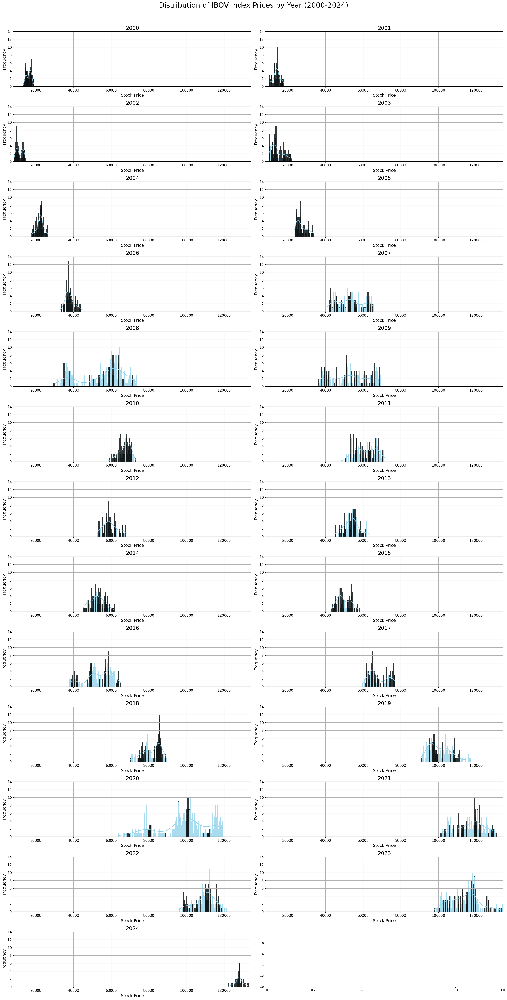

In [6]:
# Convert the 'Date' column to datetime format if it isn't already
IBOV['Date'] = pd.to_datetime(IBOV['Date'])

# Extract the year from the 'Date' column
IBOV['Year'] = IBOV['Date'].dt.year

# Set up the 13x2 grid for the subplots with larger size
fig, axes = plt.subplots(13, 2, figsize=(24, 48), sharex=False, sharey=False)
fig.suptitle('Distribution of IBOV Index Prices by Year (2000-2024)', fontsize=24)

# Plot the distribution for each year
years = sorted(IBOV['Year'].unique())
max_freq = 0  # Initialize a variable to store the maximum frequency
xlims = (IBOV['Close'].min(), IBOV['Close'].max())  # Set x-axis limits based on data range

# First loop to find the maximum frequency
for year in years:
    freq, _ = np.histogram(IBOV[IBOV['Year'] == year]['Close'], bins=100)
    max_freq = max(max_freq, max(freq))

# Second loop to plot the distributions with enhancements
for i, year in enumerate(years):
    row = i // 2
    col = i % 2
    ax = axes[row, col]
    sns.histplot(IBOV[IBOV['Year'] == year]['Close'], bins=100, kde=True, ax=ax, color='skyblue', alpha=0.7)
    ax.set_title(f'{year}', fontsize=18)
    ax.set_xlabel('Stock Price', fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    ax.set_ylim(0, max_freq)  # Set y-axis limit to the maximum frequency
    ax.set_xlim(xlims)  # Standardize x-axis range across all plots
    ax.grid(True)  # Add grid lines
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space at the top for the main title
plt.show()

# Volitility

In [7]:
# For Volitility

ibov_df = pd.read_csv('D:/UFG/Data collection/IBOV.csv')
ibov_df['Date']= pd.to_datetime(ibov_df['Date'], format='%Y-%m-%d')
ibov_df.set_index('Date', inplace=True)

# Calculate daily logarithmic returns
ibov_df['LogReturn'] = np.log(ibov_df['Close'] / ibov_df['Close'].shift(1))

# Define the rolling window (e.g., 30 days)
rolling_window = 30

# Calculate rolling volatility (standard deviation of log returns)
ibov_df['Volatility'] = ibov_df['LogReturn'].rolling(window=rolling_window).std() * np.sqrt(252)  # Annualize the volatility

# Remove any NaN values that resulted from the rolling calculation
ibov_df.dropna(inplace=True)

# Create the plotly figure
fig = go.Figure()

# Add the rolling volatility trace
fig.add_trace(go.Scatter(x=ibov_df.index, y=ibov_df['Volatility'], mode='lines', name='Rolling Volatility'))

# Update the layout
fig.update_layout(
    title='IBOV Rolling Volatility',
    xaxis_title='Date',
    yaxis_title='Volatility',
    template='plotly_dark',
    showlegend=True
)

# Show the plot
fig.show()


In [8]:
# Create the plotly figure
fig = go.Figure()

# Add the original time series
fig.add_trace(go.Scatter(x=ibov_df.index, y=ibov_df['Close'], mode='lines', name='NIFTY Close'))

# Add the rolling volatility trace
fig.add_trace(go.Scatter(x=ibov_df.index, y=ibov_df['Volatility'], mode='lines', name='Rolling Volatility', yaxis='y2'))

# Update the layout to include secondary y-axis for volatility
fig.update_layout(
    title='IBOV Close Prices and Rolling Volatility',
    xaxis_title='Date',
    yaxis_title='IBOV Close Prices',
    yaxis2=dict(
        title='Volatility',
        overlaying='y',
        side='right'
    ),
    template='plotly_dark',
    showlegend=True
)

# Show the plot
fig.show()

### *Significant Volitility peaks are observed during 2008(Housing crisis) and 2020(COVID)* 

In [9]:
# Create box plot
fig = px.box(IBOV, y='Close', title='Box Plot of IBOV Closing Prices')

# Customize layout
fig.update_layout(
    yaxis_title='Close Price',
    template='plotly_dark',
    width=800,
    height=600
)

# Show plot
fig.show()

# For Stationary data

In [10]:
# Stationary data
scaled_data, scaler = scale_data(IBOV)
df_residuals, df_trend, df_seasonal, decomposition_results = transform_to_stationary(scaled_data)

In [11]:
# Initialize figure with subplots
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, subplot_titles=("Residuals", "Trend", "Seasonal"))

# Plot residuals
fig.add_trace(
    go.Scatter(x=df_residuals.index, y=df_residuals['Close'], mode='lines', name='Residuals - Close'),
    row=1, col=1
)

# Plot trend
fig.add_trace(
    go.Scatter(x=df_trend.index, y=df_trend['Close'], mode='lines', name='Trend - Close'),
    row=2, col=1
)

# Plot seasonal
fig.add_trace(
    go.Scatter(x=df_seasonal.index, y=df_seasonal['Close'], mode='lines', name='Seasonal - Close'),
    row=3, col=1
)

# Update layout
fig.update_layout(height=800,template='plotly_dark', title_text="IBOV Time Series Decomposition - Close")

# Show plot
fig.show()

### *The trend is not strictly bullish, It contains sideways movement for many years*

Skewness of Stationary IBOV Close: -0.7310986872611629
Kurtosis of Stationary IBOV Close: 5.446416430344275

Mean of Stationary IBOV Close: -0.0004618227970163593
Standard deviation of Stationary IBOV Close: 0.03768814351368656



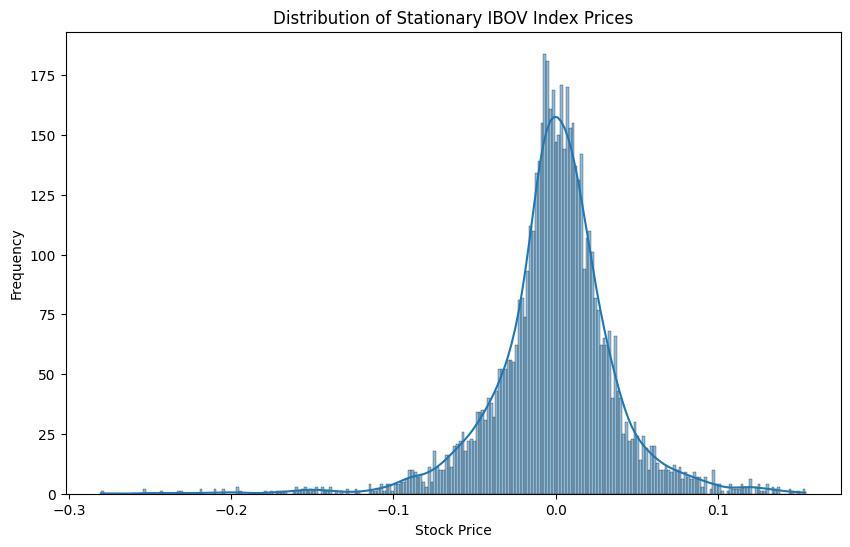

In [12]:
# Calculate the skewness and kurtosis
close_skewness = df_residuals['Close'].skew()
close_kurtosis = df_residuals['Close'].kurtosis()

print(f"Skewness of Stationary IBOV Close: {close_skewness}")
print(f"Kurtosis of Stationary IBOV Close: {close_kurtosis}\n")

mean = df_residuals['Close'].mean()
std = df_residuals['Close'].std()

print(f"Mean of Stationary IBOV Close: {mean}")
print(f"Standard deviation of Stationary IBOV Close: {std}\n")


# Plot the distribution of stock prices
plt.figure(figsize=(10, 6))
sns.histplot(df_residuals['Close'], bins=250, kde=True)
plt.title('Distribution of Stationary IBOV Index Prices')
plt.xlabel('Stock Price')
plt.ylabel('Frequency')
plt.show()

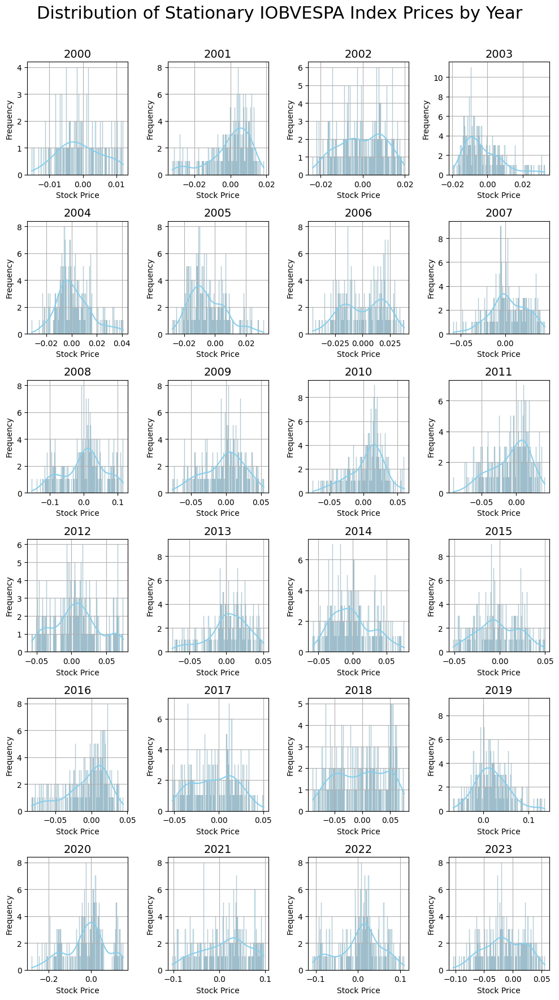

In [13]:
# Ensure that the 'Date' index is in datetime format
df_residuals.index = pd.to_datetime(df_residuals.index)

# Extract the year from the 'Date' index
df_residuals['Year'] = df_residuals.index.year

# Get the unique years
years = df_residuals['Year'].unique()

# Set up the grid for subplots with 3 columns and 8 rows
fig, axes = plt.subplots(6, 4, figsize=(10, 18), sharex=False, sharey=False)
fig.suptitle('Distribution of Stationary IOBVESPA Index Prices by Year', fontsize=22)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Plot the distribution for each year
for i, year in enumerate(years):
    sns.histplot(df_residuals[df_residuals['Year'] == year]['Close'], bins=150, kde=True, ax=axes[i], color='skyblue')
    axes[i].set_title(f'{year}', fontsize=14)
    axes[i].set_xlabel('Stock Price', fontsize=10)
    axes[i].set_ylabel('Frequency', fontsize=10)
    axes[i].grid(True)  # Add grid lines

# Remove any empty subplots if there are less than 24 years of data
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space at the top for the main title
plt.show()

# Analysing the trend

In [14]:
from scipy.signal import find_peaks, savgol_filter

# Apply a smoothing filter to the trend data
df_trend['Close_smoothed'] = savgol_filter(df_trend['Close'], window_length=150, polyorder=3)

# Identify peaks and troughs on the smoothed data
trend_peaks, _ = find_peaks(df_trend['Close_smoothed'])
trend_troughs, _ = find_peaks(-df_trend['Close_smoothed'])

# Calculate intervals between peaks and troughs
peak_intervals = np.diff(df_trend.index[trend_peaks]).astype('timedelta64[D]').astype(int)
trough_intervals = np.diff(df_trend.index[trend_troughs
                        ]).astype('timedelta64[D]').astype(int)

# Calculate days for each trough and its preceding peak
days_between_peaks_and_troughs = []
for trough in trend_troughs:
    preceding_peaks = trend_peaks[trend_peaks < trough]
    if len(preceding_peaks) > 0:
        closest_preceding_peak = preceding_peaks[-1]
        days_between = (df_trend.index[trough] - df_trend.index[closest_preceding_peak]).days
        days_between_peaks_and_troughs.append(days_between)

# Create a figure with Plotly
fig = go.Figure()

# Add the smoothed trend line
fig.add_trace(go.Scatter(x=df_trend.index, y=df_trend['Close_smoothed'], mode='lines', name='Smoothed Trend - Close'))

# Add arrows for peaks
for peak in trend_peaks:
    fig.add_annotation(
        x=df_trend.index[peak],
        y=df_trend['Close_smoothed'].iloc[peak],
        ax=df_trend.index[peak],
        ay=df_trend['Close_smoothed'].iloc[peak] + (df_trend['Close_smoothed'].max() - df_trend['Close_smoothed'].min()) * 0.05,  # Adjust the arrow length
        xref="x",
        yref="y",
        axref="x",
        ayref="y",
        showarrow=True,
        arrowhead=2,
        arrowsize=1,
        arrowcolor='red'
    )

# Add arrows for troughs
for trough in trend_troughs:
    fig.add_annotation(
        x=df_trend.index[trough],
        y=df_trend['Close_smoothed'].iloc[trough],
        ax=df_trend.index[trough],
        ay=df_trend['Close_smoothed'].iloc[trough] - (df_trend['Close_smoothed'].max() - df_trend['Close_smoothed'].min()) * 0.05,  # Adjust the arrow length
        xref="x",
        yref="y",
        axref="x",
        ayref="y",
        showarrow=True,
        arrowhead=2,
        arrowsize=1,
        arrowcolor='green'
    )

# Update layout
fig.update_layout(height=600,template='plotly_dark', title_text="NIFTY Smoothed Trend Component with Peaks and Troughs")

# Show plot
fig.show()

# Print summary statistics
print(f'Average interval between peaks: {np.mean(peak_intervals):.2f} days')
print(f'Average interval between troughs: {np.mean(trough_intervals):.2f} days')
print(f'Average interval between troughs and closet preceding peak: {np.mean(days_between_peaks_and_troughs):.2f} days')


# Optional: Detailed intervals
print("\nIntervals between successive peaks:")
print(peak_intervals)
print("\nIntervals between successive troughs:")
print(trough_intervals)
print("\nInterval between trough and closet preceding peak")
print(days_between_peaks_and_troughs)

Average interval between peaks: 752.57 days
Average interval between troughs: 913.25 days
Average interval between troughs and closet preceding peak: 327.25 days

Intervals between successive peaks:
[ 893  701  679  212 1728  630  425]

Intervals between successive troughs:
[2288 1090  645  246  525 1651  639  222]

Interval between trough and closet preceding peak
[363, 560, 504, 71, 384, 307, 316, 113]


# Observing the peaks and troughs of stationary data on original time series data

In [15]:
# Detect significant peaks and troughs in df_residuals
residual_close = df_residuals['Close'].values
residual_peaks, _ = find_peaks(residual_close, prominence=0.03)  # potimally 0.035
residual_troughs, _ = find_peaks(-residual_close, prominence=0.03)  # Adjust the prominence value as needed

# Create a figure with Plotly
fig = go.Figure()

# Add the residual data line
fig.add_trace(go.Scatter(x=df_residuals.index, y=df_residuals['Close'], mode='lines', name='Residuals - Close'))

# Add markers for significant peaks in residuals
fig.add_trace(go.Scatter(
    x=df_residuals.index[residual_peaks],
    y=df_residuals['Close'].iloc[residual_peaks],
    mode='markers',
    marker=dict(color='red', size=8, symbol='triangle-down'),
    name='Significant Peaks'
))

# Add markers for significant troughs in residuals
fig.add_trace(go.Scatter(
    x=df_residuals.index[residual_troughs],
    y=df_residuals['Close'].iloc[residual_troughs],
    mode='markers',
    marker=dict(color='green', size=8, symbol='triangle-up'),
    name='Significant Troughs'
))

# Update layout
fig.update_layout(height=600, template='plotly_dark', title_text="Residuals with Significant Peaks and Troughs")

# Show plot
fig.show()

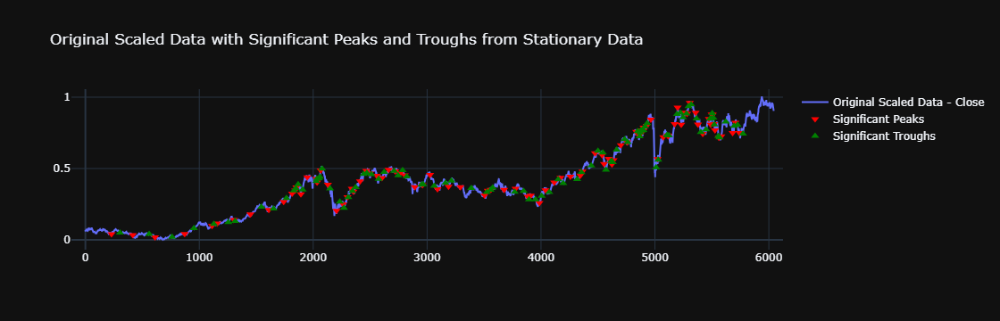

Total number of significant peaks: 95
Total number of significant troughs: 95

Significant peak indices in original scaled data:
[ 229  416  611  872 1112 1157 1303 1449 1610 1741 1815 1842 1852 1892
 1948 2029 2034 2051 2066 2129 2205 2262 2301 2339 2353 2411 2466 2497
 2558 2604 2662 2721 2764 2803 2892 2960 3026 3091 3188 3292 3504 3533
 3560 3676 3777 3884 3909 3986 4039 4116 4171 4258 4345 4364 4474 4537
 4553 4595 4623 4637 4701 4757 4836 4850 4867 4870 4879 4896 4901 4928
 4964 5023 5073 5110 5118 5173 5199 5231 5264 5282 5306 5357 5378 5420
 5474 5490 5498 5508 5518 5527 5561 5583 5682 5707 5742]

Significant trough indices in original scaled data:
[ 304  560  761  953 1128 1255 1315 1545 1651 1765 1832 1847 1868 1907
 2026 2032 2049 2060 2078 2148 2234 2270 2308 2344 2373 2443 2471 2511
 2575 2623 2710 2746 2785 2821 2950 2966 3062 3161 3214 3388 3524 3557
 3576 3769 3847 3895 3951 4006 4072 4151 4195 4317 4355 4441 4500 4543
 4570 4616 4630 4665 4734 4761 4848 4866 4869 4876 

In [16]:

# Create a figure with Plotly
fig = go.Figure()

# Add the original scaled data line
fig.add_trace(go.Scatter(x=scaled_data.index, y=scaled_data['Close'], mode='lines', name='Original Scaled Data - Close'))

# Add markers for significant peaks in residuals on the original scaled data
fig.add_trace(go.Scatter(
    x=scaled_data.index[residual_peaks],
    y=scaled_data['Close'].iloc[residual_peaks],
    mode='markers',
    marker=dict(color='red', size=8, symbol='triangle-down'),
    name='Significant Peaks'
))

# Add markers for significant troughs in residuals on the original scaled data
fig.add_trace(go.Scatter(
    x=scaled_data.index[residual_troughs],
    y=scaled_data['Close'].iloc[residual_troughs],
    mode='markers',
    marker=dict(color='green', size=8, symbol='triangle-up'),
    name='Significant Troughs'
))

# Update layout
fig.update_layout(height=600, template='plotly_dark', title_text="Original Scaled Data with Significant Peaks and Troughs from Stationary Data")

# Show plot
fig.show()

# Print summary statistics
print(f'Total number of significant peaks: {len(residual_peaks)}')
print(f'Total number of significant troughs: {len(residual_troughs)}')

# Optional: Detailed intervals
print("\nSignificant peak indices in original scaled data:")
print(residual_peaks)
print("\nSignificant trough indices in original scaled data:")
print(residual_troughs)

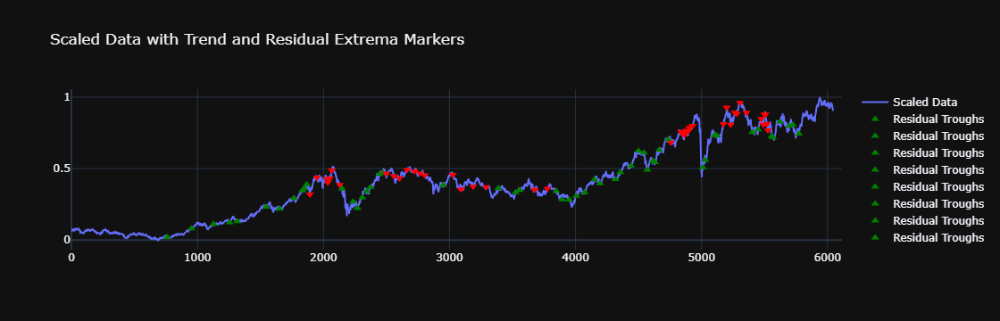

In [18]:
# Combine trend peaks and troughs into one list and sort
trend_extrema = np.sort(np.concatenate([trend_peaks, trend_troughs]))

# Initialize plot
fig = go.Figure()

# Add the scaled data line
fig.add_trace(go.Scatter(x=scaled_data.index, y=scaled_data['Close'], mode='lines', name='Scaled Data'))

# Dictionary to store peaks and troughs
extrema_dict = {'Residual Peaks': {}, 'Residual Troughs': {}}

# Initialize flags
peak_index = 0
trough_index = 0

# Traverse through trend extrema
for i in range(len(scaled_data)):
    if i in trend_extrema:
        if i in trend_peaks:
            peak_index = 1
            trough_index = 0
        if i in trend_troughs:
            peak_index = 0
            trough_index = 1

    # Plot markers based on the flags
    if peak_index == 1 and trough_index == 0:
        if i in residual_peaks:
            fig.add_trace(go.Scatter(
                x=[scaled_data.index[i]],
                y=[scaled_data['Close'].iloc[i]],
                mode='markers',
                marker=dict(color='red', size=8, symbol='triangle-down'),
                name='Residual Peaks'
            ))
            # Store in dictionary
            extrema_dict['Residual Peaks'][scaled_data.index[i]] = scaled_data['Close'].iloc[i]

    if peak_index == 0 and trough_index == 1:
        if i in residual_troughs:
            fig.add_trace(go.Scatter(
                x=[scaled_data.index[i]],
                y=[scaled_data['Close'].iloc[i]],
                mode='markers',
                marker=dict(color='green', size=8, symbol='triangle-up'),
                name='Residual Troughs'
            ))
            # Store in dictionary
            extrema_dict['Residual Troughs'][scaled_data.index[i]] = scaled_data['Close'].iloc[i]

# Update layout
fig.update_layout(height=600, template='plotly_dark', title_text="Scaled Data with Trend and Residual Extrema Markers")

# Show plot
fig.show()

### *Made a strategy involving statinoary peak and troughs, also including trend peaks and troughs to get and buy and sell signal, It is not efficient for IBOVESPA but works for NIFTY*

# Strategy

               Metric            Value
0  Initial Investment   R$1,000,000.00
1          Net Profit  R$25,625,571.00
2             ROI (%)         2562.56%
3        Sharpe Ratio             0.77
4        Max Drawdown   R$4,796,654.00
5    Max Drawdown (%)           16.39%
6            CAGR (%)           14.66%


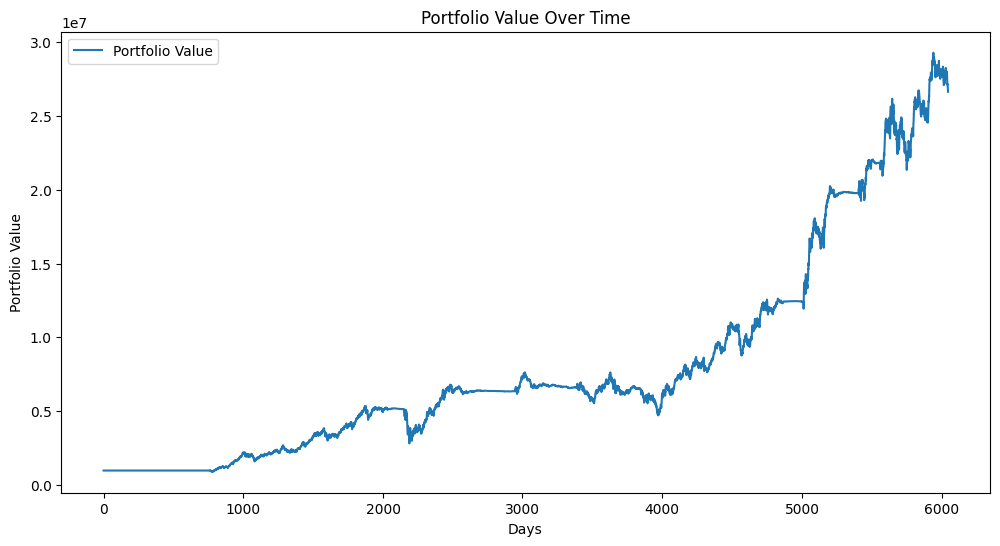

Buy on day 761 at price 10863.00, Positions: 92
Buy on day 953 at price 18541.00, Positions: 92
Buy on day 1128 at price 22361.00, Positions: 92
Buy on day 1255 at price 23818.00, Positions: 92
Buy on day 1315 at price 24767.00, Positions: 92
Buy on day 1545 at price 37474.00, Positions: 92
Buy on day 1651 at price 35797.00, Positions: 92
Buy on day 1765 at price 45197.00, Positions: 92
Buy on day 1832 at price 51813.00, Positions: 92
Buy on day 1847 at price 53713.00, Positions: 92
Buy on day 1868 at price 57374.00, Positions: 92
Sell on day 1892 at price 48559.00, Positions: 49
Sell on day 1948 at price 63562.00, Positions: 26
Sell on day 2029 at price 62280.00, Positions: 14
Sell on day 2034 at price 58987.00, Positions: 8
Sell on day 2051 at price 62618.00, Positions: 5
Sell on day 2066 at price 69722.00, Positions: 3
Sell on day 2129 at price 57018.00, Positions: 2
Buy on day 2148 at price 53527.00, Positions: 96
Buy on day 2234 at price 41991.00, Positions: 96
Buy on day 2270 at 

In [23]:
# Initialize variables
initial_capital = 1000000  # 10 lakhs
capital = initial_capital
positions = 0
cash = capital
portfolio_value = []
trades = []

# Buying-selling percentage
buying_percentage = 1
selling_percentage = 0.47

# Extract days from extrema_dict
buy_days = list(extrema_dict['Residual Troughs'].keys())
sell_days = list(extrema_dict['Residual Peaks'].keys())

# Backtesting logic
for i in range(len(IBOV)):
    if i in buy_days:  # Buy signal at troughs
        buy_price = IBOV['Close'].iloc[i]
        amount_to_invest = cash * buying_percentage # using avialable cash
        quantity = int(amount_to_invest / buy_price)  # Calculate quantity based on available cash
        
        if cash >= buy_price * quantity:
            positions += quantity
            cash -= buy_price * quantity
            trades.append(('Buy', IBOV.index[i], buy_price, positions))
    
    if i in sell_days:  # Sell signal at peaks
        if positions > 0:
            sell_quantity = max(1, int(positions * selling_percentage))  # Sell 25% of holdings
            sell_price = IBOV['Close'].iloc[i]
            positions -= sell_quantity
            cash += sell_quantity * sell_price
            trades.append(('Sell', IBOV.index[i], sell_price, positions))
    
    # Calculate portfolio value (positions * current price + cash)
    current_value = positions * IBOV['Close'].iloc[i] + cash
    portfolio_value.append(current_value)

# Convert portfolio_value list to a numpy array for easier calculations
portfolio_value = np.array(portfolio_value)

# Performance metrics
net_profit = portfolio_value[-1] - initial_capital
roi = (portfolio_value[-1] - initial_capital) / initial_capital * 100
returns = np.diff(portfolio_value) / portfolio_value[:-1]
sharpe_ratio = np.mean(returns) / np.std(returns) * np.sqrt(252)  # Assuming daily data
max_drawdown = np.max(np.maximum.accumulate(portfolio_value) - portfolio_value)
max_drawdown_pct = max_drawdown / np.maximum.accumulate(portfolio_value).max() * 100

# Calculate Compound Annual Growth Rate (CAGR)
days_invested = len(portfolio_value)
years_invested = days_invested / 252  # Assuming 252 trading days per year
cagr = ((portfolio_value[-1] / initial_capital) ** (1 / years_invested) - 1) * 100

# Create a dataframe to display the metrics
metrics_df = pd.DataFrame({
    'Metric': ['Initial Investment', 'Net Profit', 'ROI (%)', 'Sharpe Ratio', 'Max Drawdown', 'Max Drawdown (%)', 'CAGR (%)'],
    'Value': [f"R${initial_capital:,.2f}", 
              f"R${net_profit:,.2f}", 
              f"{roi:.2f}%", 
              f"{sharpe_ratio:.2f}", 
              f"R${max_drawdown:,.2f}", 
              f"{max_drawdown_pct:.2f}%", 
              f"{cagr:.2f}%"]
})

# Display the metrics
display(metrics_df)

# Plot the portfolio value over time
plt.figure(figsize=(12, 6))
plt.plot(portfolio_value, label='Portfolio Value')
plt.title('Portfolio Value Over Time')
plt.xlabel('Days')
plt.ylabel('Portfolio Value')
plt.legend()
plt.show()

# Optional: Print the trades
for trade in trades:
    print(f"{trade[0]} on day {trade[1]} at price {trade[2]:.2f}, Positions: {trade[3]}")


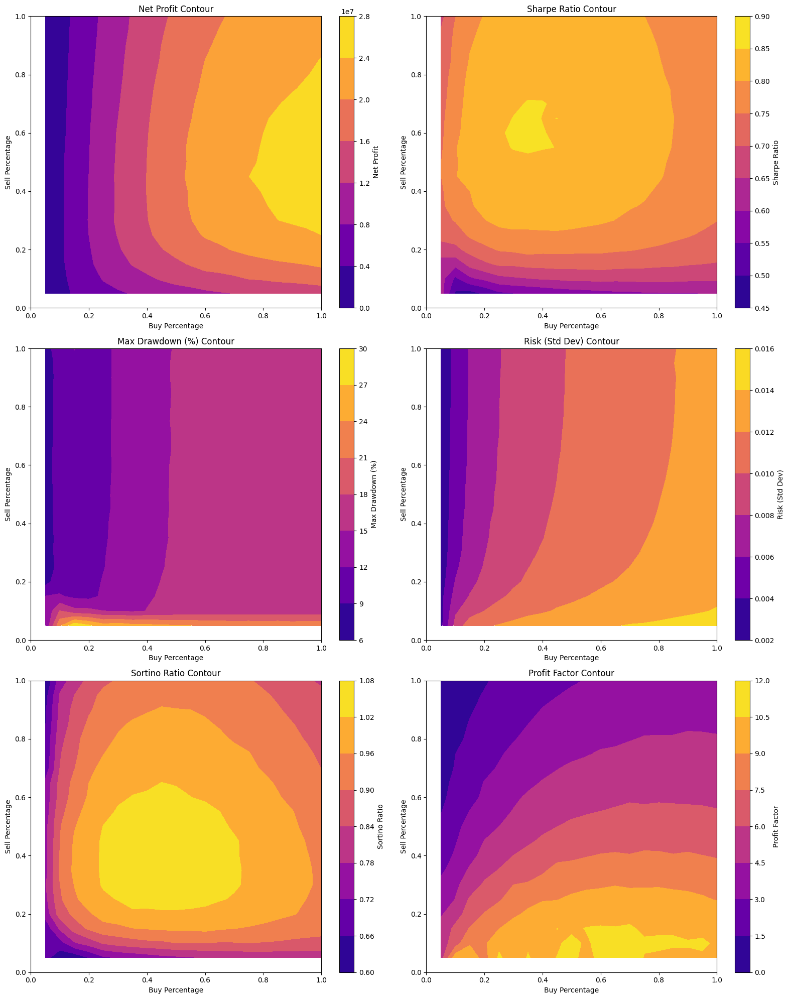

In [21]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import ParameterGrid

# Function to perform backtesting with given buy and sell percentages
def backtest_strategy(buy_pct, sell_pct):
    capital = initial_capital
    positions = 0
    cash = capital
    portfolio_value = []
    trade_count = 0
    winning_trades = 0
    losing_trades = 0
    total_profit = 0
    total_loss = 0
    
    for i in range(len(IBOV)):
        if i in buy_days:
            buy_price = IBOV['Close'].iloc[i]
            amount_to_invest = cash * buy_pct
            quantity = int(amount_to_invest / buy_price)
            if cash >= buy_price * quantity:
                positions += quantity
                cash -= buy_price * quantity
        
        if i in sell_days and positions > 0:
            sell_quantity = max(1, int(positions * sell_pct))
            sell_price = IBOV['Close'].iloc[i]
            profit = sell_quantity * (sell_price - buy_price)
            total_profit += profit if profit > 0 else 0
            total_loss += -profit if profit < 0 else 0
            winning_trades += 1 if profit > 0 else 0
            losing_trades += 1 if profit < 0 else 0
            trade_count += 1
            positions -= sell_quantity
            cash += sell_quantity * sell_price
        
        current_value = positions * IBOV['Close'].iloc[i] + cash
        portfolio_value.append(current_value)
    
    portfolio_value = np.array(portfolio_value)
    
    # Calculate performance metrics
    net_profit = portfolio_value[-1] - initial_capital
    returns = np.diff(portfolio_value) / portfolio_value[:-1]
    sharpe_ratio = np.mean(returns) / np.std(returns) * np.sqrt(252)
    
    # Sortino Ratio
    downside_returns = returns[returns < 0]
    sortino_ratio = np.mean(returns) / np.std(downside_returns) * np.sqrt(252) if len(downside_returns) > 0 else 0
    
    # Calculate drawdown
    drawdowns = np.maximum.accumulate(portfolio_value) - portfolio_value
    max_drawdown = np.max(drawdowns)
    max_drawdown_pct = max_drawdown / np.maximum.accumulate(portfolio_value).max() * 100
    
    # Calculate risk (standard deviation of returns)
    risk = np.std(returns)
    
    # Profit Factor
    profit_factor = total_profit / total_loss if total_loss != 0 else 0
    
    return net_profit, sharpe_ratio, max_drawdown_pct, risk, sortino_ratio, profit_factor

# Define the grid of buy/sell percentages to search
param_grid = {
    'buy_pct': np.linspace(0.05, 1.0, 20),  # From 5% to 100% of cash
    'sell_pct': np.linspace(0.05, 1.0, 20)  # From 5% to 100% of positions
}

# Initialize lists to store results
results = {
    'Net Profit': [],
    'Sharpe Ratio': [],
    'Max Drawdown (%)': [],
    'Risk (Std Dev)': [],
    'Sortino Ratio': [],
    'Profit Factor': [],
    'Buy Percentage': [],
    'Sell Percentage': []
}

# Perform grid search
for param in ParameterGrid(param_grid):
    buy_pct = param['buy_pct']
    sell_pct = param['sell_pct']
    results_data = backtest_strategy(buy_pct, sell_pct)
    
    for key, value in zip(results.keys(), results_data):
        results[key].append(value)
    
    results['Buy Percentage'].append(buy_pct)
    results['Sell Percentage'].append(sell_pct)

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Reshape data for contour plotting
X, Y = np.meshgrid(np.unique(results_df['Buy Percentage']), np.unique(results_df['Sell Percentage']))

Z_metrics = {metric: results_df.pivot(index='Sell Percentage', columns='Buy Percentage', values=metric).values
             for metric in results.keys() if metric not in ['Buy Percentage', 'Sell Percentage']}

# Plot contour plots for selected metrics
fig, axes = plt.subplots(3, 2, figsize=(16, 20))

cmap = 'plasma'  # Using the plasma colormap

for ax, (metric_name, Z) in zip(axes.flatten(), Z_metrics.items()):
    cp = ax.contourf(X, Y, Z, cmap=cmap)
    fig.colorbar(cp, ax=ax, label=metric_name)
    ax.set_title(f'{metric_name} Contour')
    ax.set_xlabel('Buy Percentage')
    ax.set_ylabel('Sell Percentage')
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

plt.tight_layout()
plt.show()


In [22]:
import numpy as np
import pandas as pd
from sklearn.model_selection import ParameterGrid
from scipy.optimize import minimize
from skopt import gp_minimize
from skopt.space import Real

# Define the weighted sum function for optimization
def objective_function(params, weights):
    buy_pct, sell_pct = params
    metrics = backtest_strategy(buy_pct, sell_pct)
    
    # Apply the weights to each metric
    weighted_sum = np.dot(metrics, weights)
    
    # Minimize the negative weighted sum to maximize it
    return -weighted_sum

# Define weights for each metric (you can adjust these)
weights = np.array([1.0, 1.0, -1.0, -1.0, 1.0, 1.0])  # Positive for metrics to maximize, negative for metrics to minimize

# Define the bounds for buy and sell percentages
bounds = [(0.05, 1.0), (0.05, 1.0)]  # Both buy and sell percentages between 5% and 100%

# Perform Bayesian Optimization
result = gp_minimize(
    func=lambda params: objective_function(params, weights),
    dimensions=bounds,
    n_calls=50,  # Number of evaluations
    random_state=42,
    acq_func='EI'  # Acquisition function
)

# Extract the optimal buy and sell percentages
optimal_buy_pct, optimal_sell_pct = result.x

# Display the optimal buy and sell percentages
print(f"Optimal Buy Percentage: {optimal_buy_pct}")
print(f"Optimal Sell Percentage: {optimal_sell_pct}")

# Evaluate the strategy using the optimal parameters
optimal_metrics = backtest_strategy(optimal_buy_pct, optimal_sell_pct)
metric_names = ['Net Profit', 'Sharpe Ratio', 'Max Drawdown (%)', 'Risk (Std Dev)', 'Sortino Ratio', 'Profit Factor']

# Display the metrics for the optimal parameters
for name, value in zip(metric_names, optimal_metrics):
    print(f"{name}: {value}")


Optimal Buy Percentage: 1.0
Optimal Sell Percentage: 0.4785345229661084
Net Profit: 25756669.0
Sharpe Ratio: 0.7695077955522696
Max Drawdown (%): 16.386816661658
Risk (Std Dev): 0.012950146190462612
Sortino Ratio: 0.9436295266373955
Profit Factor: 6.666266883233182
